
# **Course Title:** Data Analytics
# **Lecturer Name:** Satya Prakash
# **Module/Subject Title:** B9DA109 MACHINE LEARNING AND PATTERN RECOGNITION (B9DA109_2324_TMD1S)
# **Assignment Title:** CA_2
# **Task 2**  : Using the image dataset from the following link
(https://drive.google.com/drive/folders/1KALEdYfDuRQoulip7Qwa9S4R0v4ZXWDH?usp=drive_link) apply two classification models and compare their results. One model must be a convolutional neural network (CNN), and the second must use a transfer learning algorithm for the same dataset. To get full marks, you should also implement fine-tuning of the algorithms. The images provided are in their respective classification labels, so you must determine how to import and use the data. You must document your code and give a full explanation about what each block of code does to receive full marks. Save your Jupyter Notebook/Colab Notebook in this format:   

# **Student number & name as per ID card:**   
* 20016170 - David Ninan
* 20016392 - Suprith Swamy
* 20006747 - Sarvesh Pandey

Colab Project Link : https://colab.research.google.com/drive/1qH7YVw9-BcRZ07Px2ehEH-0WlCfYE5SI?usp=sharing

Question 3 Dataset Link : https://drive.google.com/drive/folders/1KALEdYfDuRQoulip7Qwa9S4R0v4ZXWDH

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

from keras.callbacks import EarlyStopping

# Convolutional Neural Network (CNN)

In [ ]:
import pathlib
from pathlib import Path
import imghdr

# Importing Data into the code
data_dir = "/content/drive/MyDrive/Chocolate Classification"
data = pathlib.Path('/content/drive/MyDrive/Chocolate Classification')
count = len(list(data.glob('*/*.jpg')))
count

120

## Removing Images which format is not supported by TensorFlow


In [ ]:
import os

image_extensions = [".png", ".jpg"]  # add there all your images file extensions

img_type_accepted_by_tf = ["bmp", "gif", "jpeg", "png"]
for filepath in Path(data_dir).rglob("*"):
    if filepath.suffix.lower() in image_extensions:
        img_type = imghdr.what(filepath)
        if img_type is None:
            print(f"{filepath} is not an image")
        elif img_type not in img_type_accepted_by_tf:
            print(f"{filepath} is a {img_type}, not accepted by TensorFlow")
            if os.path.isfile(filepath):
              os.remove(filepath)

/content/drive/MyDrive/Chocolate Classification/White Chocolate/Image_10.jpg is a webp, not accepted by TensorFlow
/content/drive/MyDrive/Chocolate Classification/White Chocolate/Image_56.jpg is a webp, not accepted by TensorFlow
/content/drive/MyDrive/Chocolate Classification/Dark Chocolate/Image_140.jpg is a webp, not accepted by TensorFlow


In [ ]:

count = len(list(data.glob('*/*.jpg')))
count

117

## Visualize the data


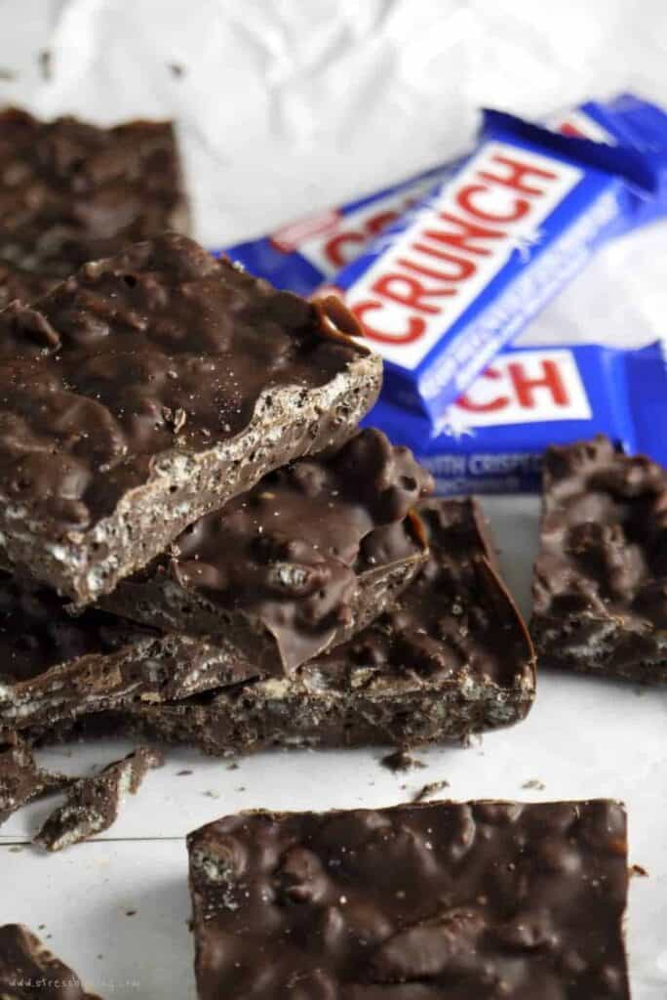

In [ ]:
dark_chocolate = list(data.glob('Dark Chocolate/*'))
PIL.Image.open(str(dark_chocolate[0]))

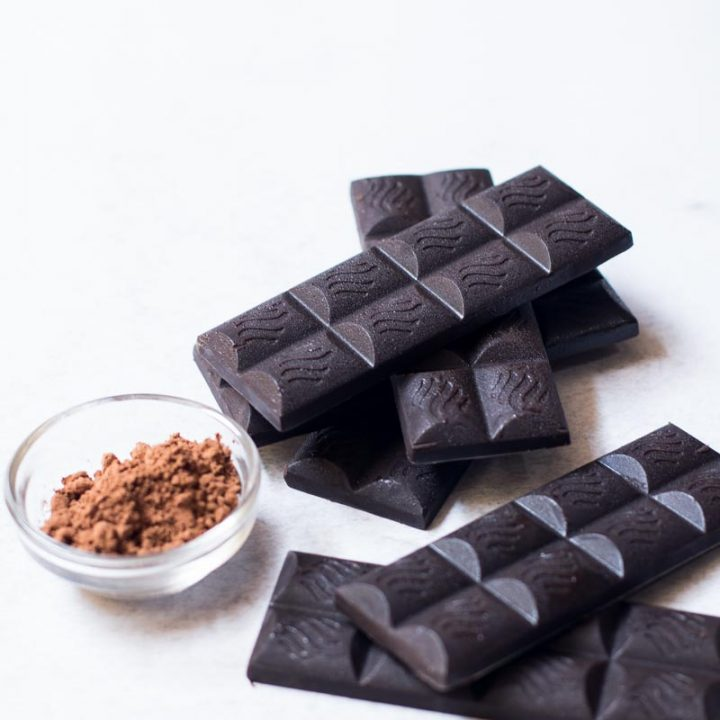

In [ ]:
PIL.Image.open(str(dark_chocolate[1]))

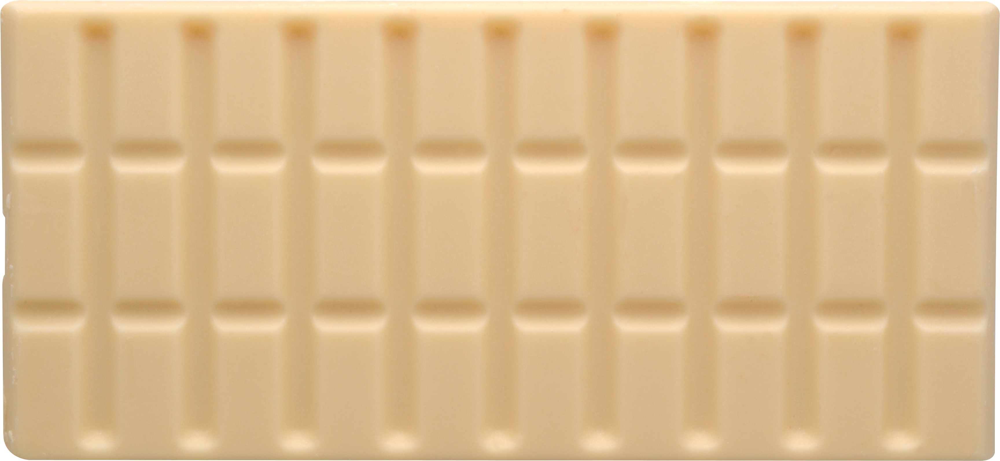

In [ ]:
white_chocolate = list(data.glob('White Chocolate/*'))
PIL.Image.open(str(white_chocolate[0]))

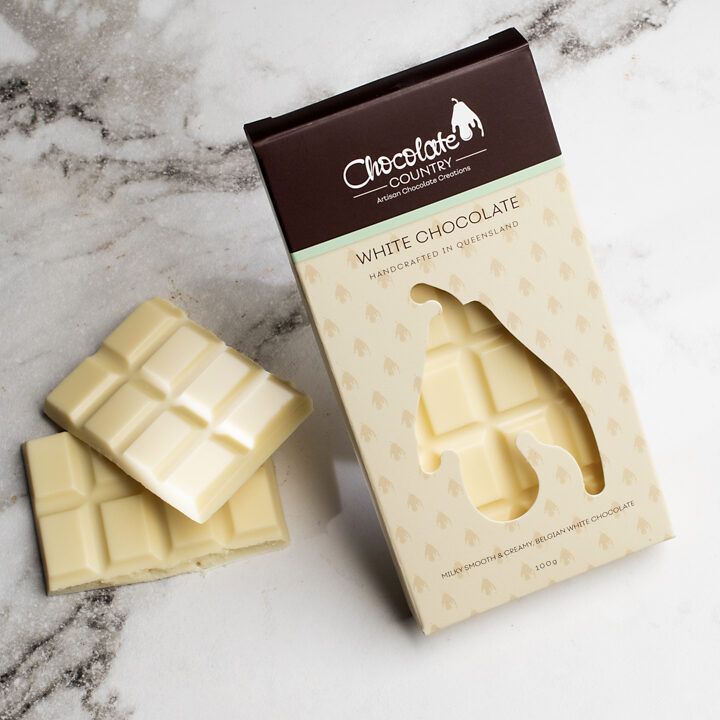

In [ ]:
PIL.Image.open(str(white_chocolate[1]))

## Creating Dataset using a Keras utility


In [ ]:
# We have only 117 images and therefore the batch size of 16 would give us optimized results
batch_size = 16

# For Building a model we need change the image size as high resolution can slow our model
# Also for Transfer learning tensorflow: supported`input_shape` is [96, 128, 160, 192, 224].
img_height = 192
img_width = 192

Split the data into 80% training and 20% test data sets

In [ ]:
# training set

train_ds = tf.keras.utils.image_dataset_from_directory(
  data,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


Found 134 files belonging to 2 classes.
Using 108 files for training.


In [ ]:
# test set
val_ds = tf.keras.utils.image_dataset_from_directory(
  data,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


Found 134 files belonging to 2 classes.
Using 26 files for validation.


In [ ]:
# The Classes of images
class_names = train_ds.class_names
print(class_names)

['Dark Chocolate', 'White Chocolate']


## Here are the first nine images from the training dataset:

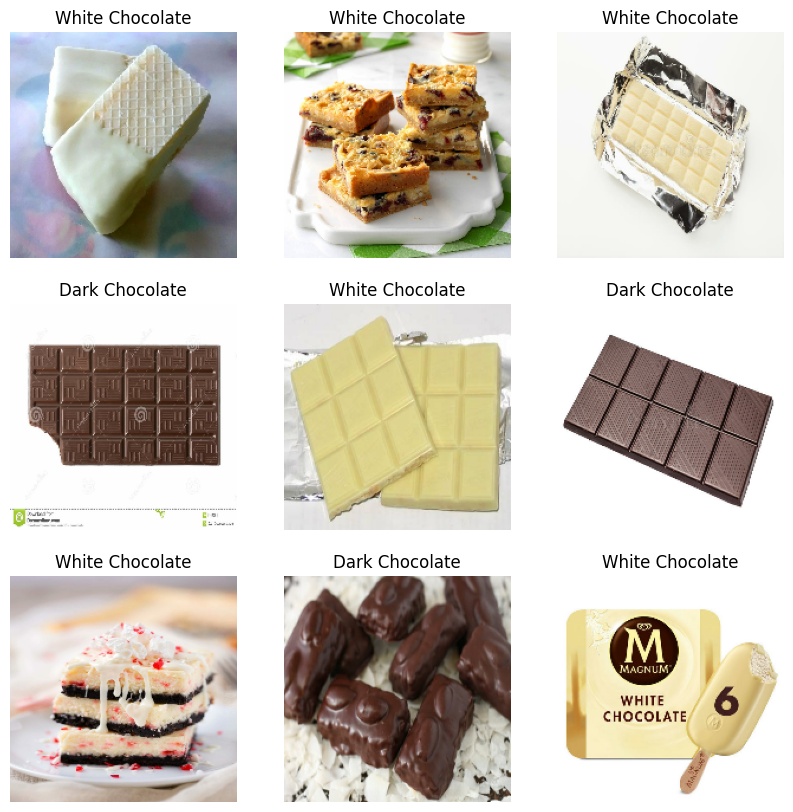

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
# Checking Our Batch shape
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(16, 192, 192, 3)
(16,)


We have batch of 16, with image height and width 192. And it is considering color channel as well.

In [ ]:
# Storing train and test data in cache memory for optimized performance
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Standardizing the Data

In [ ]:
normalization_layer = layers.Rescaling(1./255)

In [ ]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


## Creating A Model

In [ ]:
# we have only 2 classes
num_classes = len(class_names)

# Using mulitple layer we understand the data better -
# Rescaling  - Rescales the entire data between 0 and 1
# Padding - we want the shape of input and output to be of same
# Conv2D - it is responsible for learning all the features like color, shapes with image
# MaxPooling2D - opimizes the features learned from Conv2D
# Flatten - Flattens the output from mulitiple dimensions to single dimension

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

## Building the model and Fine Tuning usig optimizer "SGD"

In [ ]:
# As we have have only two classes we can also use BinaryCrossentropy

model.compile(optimizer='SGD',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_17 (Rescaling)    (None, 192, 192, 3)       0         
                                                                 
 conv2d_36 (Conv2D)          (None, 192, 192, 16)      448       
                                                                 
 max_pooling2d_36 (MaxPooli  (None, 96, 96, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_37 (Conv2D)          (None, 96, 96, 32)        4640      
                                                                 
 max_pooling2d_37 (MaxPooli  (None, 48, 48, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_38 (Conv2D)          (None, 48, 48, 64)      

Thus we have found 4742562 paramenters and all of them need to be trained.

Train the Model

In [ ]:
epochs=10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/10
7/7 [==============================] - 4s 536ms/step - loss: 0.6953 - accuracy: 0.4444 - val_loss: 0.6737 - val_accuracy: 0.8462
Epoch 2/10
7/7 [==============================] - 2s 353ms/step - loss: 0.6818 - accuracy: 0.6852 - val_loss: 0.6552 - val_accuracy: 0.8462
Epoch 3/10
7/7 [==============================] - 2s 346ms/step - loss: 0.6633 - accuracy: 0.6852 - val_loss: 0.6147 - val_accuracy: 0.8462
Epoch 4/10
7/7 [==============================] - 3s 414ms/step - loss: 0.6449 - accuracy: 0.6019 - val_loss: 0.6407 - val_accuracy: 0.7308
Epoch 5/10
7/7 [==============================] - 2s 325ms/step - loss: 0.6282 - accuracy: 0.7870 - val_loss: 0.6300 - val_accuracy: 0.7308
Epoch 6/10
7/7 [==============================] - 2s 327ms/step - loss: 0.5772 - accuracy: 0.7778 - val_loss: 0.5549 - val_accuracy: 0.9231
Epoch 7/10
7/7 [==============================] - 2s 359ms/step - loss: 0.5854 - accuracy: 0.6852 - val_loss: 0.4724 - val_accuracy: 0.9231
Epoch 8/10
7/7 [====

Visualize training results

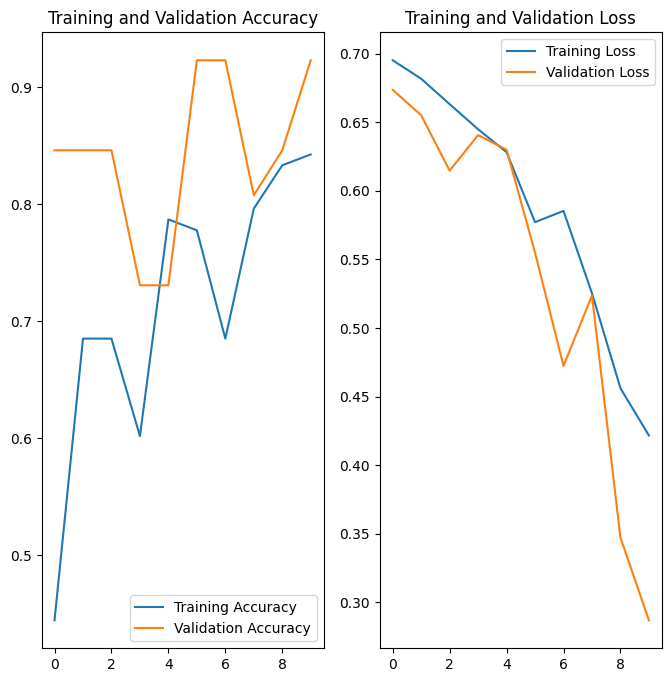

In [ ]:
#Create plots of the loss and accuracy on the training and validation sets:

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Building the model and Fine Tuning usig optimizer "adam"

In [ ]:
# As we have have only two classes we can also use BinaryCrossentropy

model.compile(optimizer='adam',
              loss=tf.keras.losses. SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_13 (Rescaling)    (None, 192, 192, 3)       0         
                                                                 
 conv2d_27 (Conv2D)          (None, 192, 192, 16)      448       
                                                                 
 max_pooling2d_27 (MaxPooli  (None, 96, 96, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_28 (Conv2D)          (None, 96, 96, 32)        4640      
                                                                 
 max_pooling2d_28 (MaxPooli  (None, 48, 48, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_29 (Conv2D)          (None, 48, 48, 64)      

Thus we have found 4742562 paramenters and all of them need to be trained.

Train the Model

In [ ]:
epochs=10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/10
7/7 [==============================] - 4s 390ms/step - loss: 0.8527 - accuracy: 0.8426 - val_loss: 0.1187 - val_accuracy: 0.9231
Epoch 2/10
7/7 [==============================] - 3s 372ms/step - loss: 0.1413 - accuracy: 0.9444 - val_loss: 0.1852 - val_accuracy: 0.8846
Epoch 3/10
7/7 [==============================] - 3s 387ms/step - loss: 0.1053 - accuracy: 0.9815 - val_loss: 0.1669 - val_accuracy: 0.9231
Epoch 4/10
7/7 [==============================] - 3s 366ms/step - loss: 0.0490 - accuracy: 0.9815 - val_loss: 0.1983 - val_accuracy: 0.9231
Epoch 5/10
7/7 [==============================] - 3s 379ms/step - loss: 0.0312 - accuracy: 0.9907 - val_loss: 0.2298 - val_accuracy: 0.8846
Epoch 6/10
7/7 [==============================] - 3s 414ms/step - loss: 0.0200 - accuracy: 0.9907 - val_loss: 0.2400 - val_accuracy: 0.8846
Epoch 7/10
7/7 [==============================] - 3s 383ms/step - loss: 0.0172 - accuracy: 1.0000 - val_loss: 0.2640 - val_accuracy: 0.8846
Epoch 8/10
7/7 [====

Visualize training results

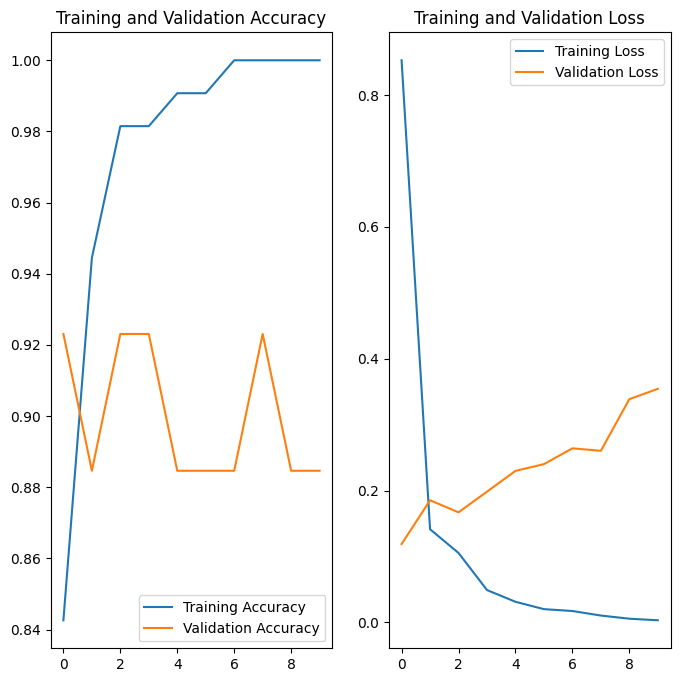

In [ ]:
#Create plots of the loss and accuracy on the training and validation sets:

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Intrepretation :
1. We have high validation loss using optimizer SGS although it follows similar pattern more closely.
"adam" has higher accuracy is given by "adam" i.e. 96.15% with lower validation loss. Thus we will continue with "adam".
2. We get the test accuracy: 0.9815 and validation accuracy: 0.9231, suggesting not so much diffrence. Also lowest lowest val_loss: 0.1983 at epoch 4.
3. The training and test validation have very little discrepancy as shown in graphs. Suggesting no overfitting of data.

3. As we have high accuracy results we can implement some concepts of overfitting for better learning result.


## Overfitting :
To address overfitting we a perform Data Augmentation

In [ ]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

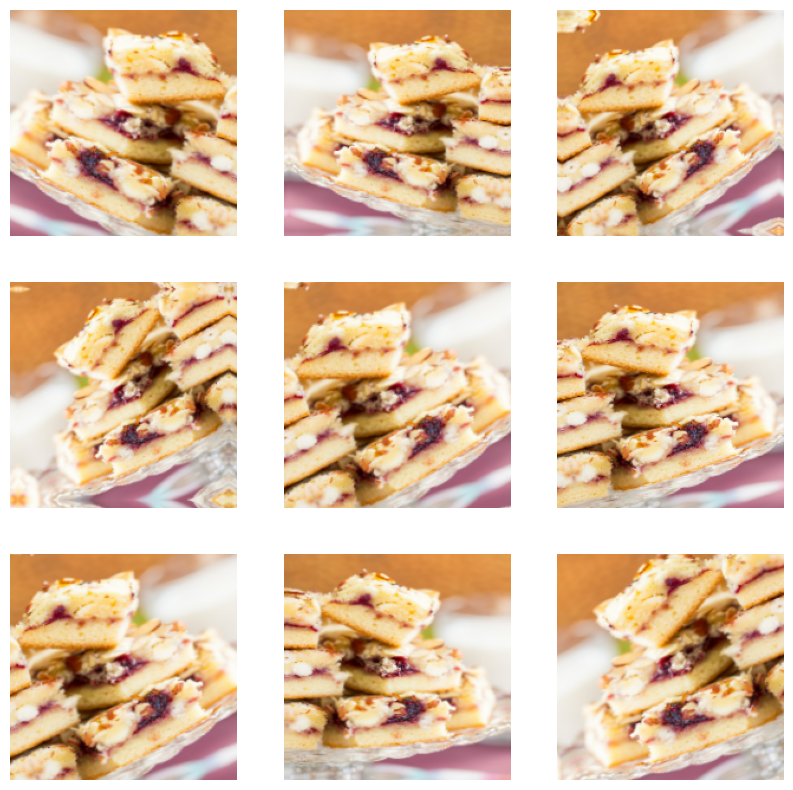

In [ ]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

Thus data augmentation creates mulitple copies of same image in mulitple ways such as - zoomed, rotated clockwise or anticlockwise, flipped vertically or horizontally. As an image would be presented in real world

Another way to address Overfiting is through Dropout.

It reduces number of noises in the data. We had added dropout 0.3.

In [ ]:
model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.3),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes, name="outputs")
])

## Compile and train the model with the fine tuning

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_13 (Sequential)  (None, 192, 192, 3)       0         
                                                                 
 rescaling_14 (Rescaling)    (None, 192, 192, 3)       0         
                                                                 
 conv2d_30 (Conv2D)          (None, 192, 192, 16)      448       
                                                                 
 max_pooling2d_30 (MaxPooli  (None, 96, 96, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_31 (Conv2D)          (None, 96, 96, 32)        4640      
                                                                 
 max_pooling2d_31 (MaxPooli  (None, 48, 48, 32)        0         
 ng2D)                                               

Thus we have found 4742562 paramenters and all of them need to be trained.

In [ ]:
epochs = 10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/10
7/7 [==============================] - 4s 448ms/step - loss: 1.7243 - accuracy: 0.5278 - val_loss: 0.5317 - val_accuracy: 0.6923
Epoch 2/10
7/7 [==============================] - 4s 569ms/step - loss: 0.6543 - accuracy: 0.6296 - val_loss: 0.6388 - val_accuracy: 0.6923
Epoch 3/10
7/7 [==============================] - 3s 440ms/step - loss: 0.5625 - accuracy: 0.7685 - val_loss: 0.4901 - val_accuracy: 0.7308
Epoch 4/10
7/7 [==============================] - 3s 426ms/step - loss: 0.4161 - accuracy: 0.8333 - val_loss: 0.2063 - val_accuracy: 0.9615
Epoch 5/10
7/7 [==============================] - 6s 1s/step - loss: 0.3699 - accuracy: 0.8519 - val_loss: 0.2167 - val_accuracy: 0.9231
Epoch 6/10
7/7 [==============================] - 4s 586ms/step - loss: 0.2750 - accuracy: 0.8889 - val_loss: 0.1770 - val_accuracy: 0.9231
Epoch 7/10
7/7 [==============================] - 3s 504ms/step - loss: 0.2660 - accuracy: 0.9074 - val_loss: 0.1671 - val_accuracy: 0.9231
Epoch 8/10
7/7 [=======

## Visualize training results

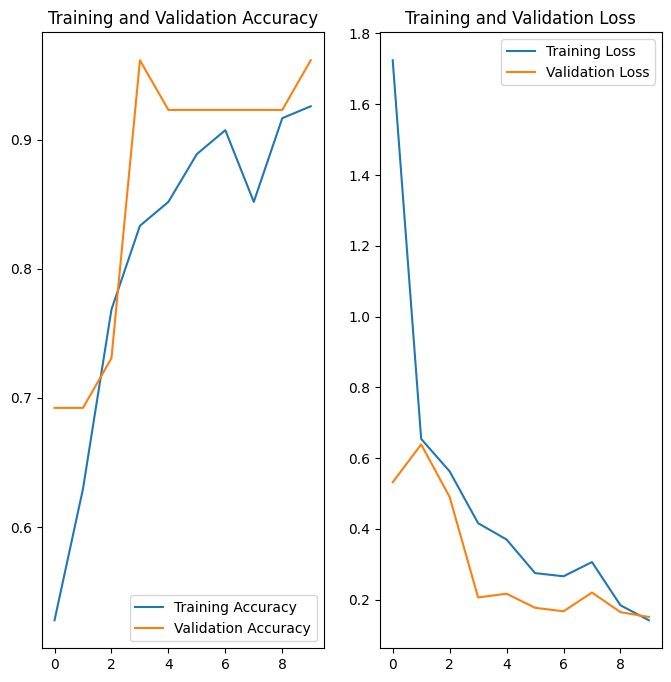

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Interpretation
1. With same no. of epochs = 10, our results have become more poor with an increase in validation loss.
2. To Deal with this and find better results : -
a) can increase the no. of epochs whilst implementing early stopping.
b) adding droputs to mulitple convolutional layers

In [ ]:
model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.3),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.3),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.3),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes, name="outputs")
])

## Compile and train the model with the fine tuning with higher epochs and mulitple dropouts

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_13 (Sequential)  (None, 192, 192, 3)       0         
                                                                 
 rescaling_15 (Rescaling)    (None, 192, 192, 3)       0         
                                                                 
 conv2d_33 (Conv2D)          (None, 192, 192, 16)      448       
                                                                 
 max_pooling2d_33 (MaxPooli  (None, 96, 96, 16)        0         
 ng2D)                                                           
                                                                 
 dropout_7 (Dropout)         (None, 96, 96, 16)        0         
                                                                 
 conv2d_34 (Conv2D)          (None, 96, 96, 32)        4640      
                                                     

Thus we have found 4742562 paramenters and all of them need to be trained.

## Using Early Stopping : -

1. Early Stopping - This selects the model that is giving the best validation loss.


2. Patient early stopping - When iterating high no. of epochs, this will help us to stop the iteration if there is no improvement in performance. Here, I have set Patience as 10.  

In [ ]:
# early stopping -
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

epochs = 50
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[es]
)

Epoch 1/50
7/7 [==============================] - 4s 468ms/step - loss: 1.8339 - accuracy: 0.5093 - val_loss: 0.6833 - val_accuracy: 0.5000
Epoch 2/50
7/7 [==============================] - 3s 442ms/step - loss: 0.6179 - accuracy: 0.6944 - val_loss: 0.6660 - val_accuracy: 0.7692
Epoch 3/50
7/7 [==============================] - 4s 626ms/step - loss: 0.5924 - accuracy: 0.7500 - val_loss: 0.6622 - val_accuracy: 0.7308
Epoch 4/50
7/7 [==============================] - 3s 451ms/step - loss: 0.5091 - accuracy: 0.9259 - val_loss: 0.6002 - val_accuracy: 0.8846
Epoch 5/50
7/7 [==============================] - 3s 456ms/step - loss: 0.3744 - accuracy: 0.8981 - val_loss: 0.4560 - val_accuracy: 0.9231
Epoch 6/50
7/7 [==============================] - 4s 580ms/step - loss: 0.2919 - accuracy: 0.8796 - val_loss: 0.3719 - val_accuracy: 0.9231
Epoch 7/50
7/7 [==============================] - 3s 441ms/step - loss: 0.1789 - accuracy: 0.9259 - val_loss: 0.3067 - val_accuracy: 0.9231
Epoch 8/50
7/7 [====

## With help of Early stoping our code stopped at 32nd epoch. Giving the best result of
* loss: 0.0487
* accuracy: 0.9722
* val_loss: 0.2578
* val_accuracy: 0.9615

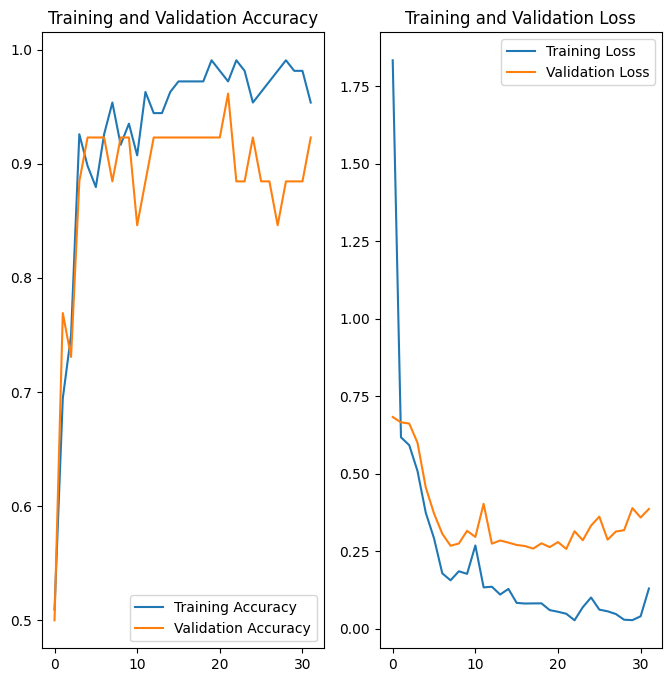

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(val_acc))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# Transfer Learning

* For transfer learning the scaling of image should be same as the transfer learning model
* Transfer learning model expects pixel values in [-1, 1], but at this point, the pixel values in our images are in [0, 255].
* To rescale them, use the preprocessing method included with the model.

In [ ]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

# another way to do this is
# rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1)

# Create the base model from the pre-trained convnets

* We will create the base model from the MobileNet V2 model developed at Google.

* This is pre-trained on the ImageNet dataset, a large dataset consisting of 1.4M images and 1000 classes.

* Thus using its knowledge it will help us classify Dark and White Chocolate from our specify data

In [ ]:
# training set

train_ds = tf.keras.utils.image_dataset_from_directory(
  data,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)
# test set
val_ds = tf.keras.utils.image_dataset_from_directory(
  data,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)
# Storing train and test data in cache memory for optimized performance
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Create the base model from the pre-trained model MobileNet V2
BATCH_SIZE = 16
IMG_SIZE = (192, 192)

IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

Found 134 files belonging to 2 classes.
Using 108 files for training.
Found 134 files belonging to 2 classes.
Using 26 files for validation.


## Fine tuning using data augmentation

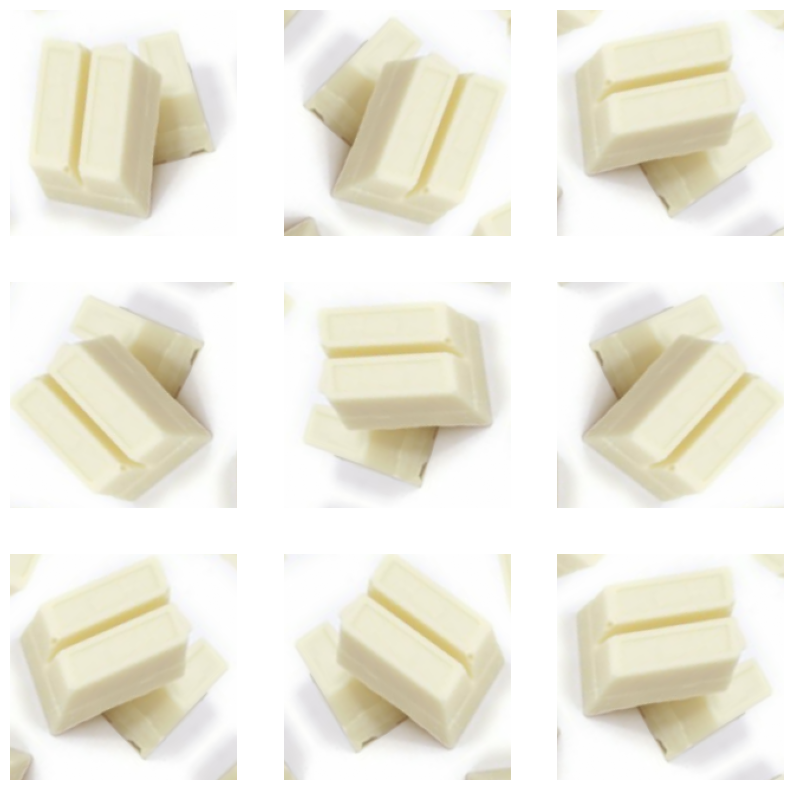

In [ ]:
# Use data augmentation
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])

for image, _ in train_ds.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

## The feature extractor reshapes each 192x192x3 image into a 6x6x1280 block of features.

In [ ]:
image_batch, label_batch = next(iter(train_ds))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(12, 6, 6, 1280)


## Feature extraction

* We Freeze the convolutional base by setting layer.trainable = False.
* This is to prevent the model to get retrained mulitple times.

In [ ]:
base_model.trainable = False

In [ ]:
# Let's take a look at the base model architecture
base_model.summary()

Model: "mobilenetv2_1.00_192"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_9 (InputLayer)        [(None, 192, 192, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 96, 96, 32)           864       ['input_9[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 96, 96, 32)           128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 96, 96, 32)           0         ['bn_Conv1[

Thus we have found 2257984 paramenters out which not them need to be trained.

In [ ]:
# Add a classification head
# like in in the previous model we added Flattend layer in this model we add GlobalAveragePooling2D

global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(12, 1280)


In [ ]:
# Apply a tf.keras.layers.Dense
prediction_layer = tf.keras.layers.Dense(1) # single neuron as it a binary class classification
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(12, 1)


In [ ]:
# Build a model by chaining together the data augmentation, rescaling, base_model and feature extractor layers using the Keras Functional API.

inputs = tf.keras.Input(shape=(192, 192, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [ ]:
model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 192, 192, 3)]     0         
                                                                 
 sequential_19 (Sequential)  (None, 192, 192, 3)       0         
                                                                 
 tf.math.truediv_4 (TFOpLam  (None, 192, 192, 3)       0         
 bda)                                                            
                                                                 
 tf.math.subtract_4 (TFOpLa  (None, 192, 192, 3)       0         
 mbda)                                                           
                                                                 
 mobilenetv2_1.00_192 (Func  (None, 6, 6, 1280)        2257984   
 tional)                                                         
                                                           

We have got 2259265 parameter out of which 1281 need to trained.


This means, there are some features in the current image data set which are not same as the one in the mobile net. Hence we have renewable parameters.


In [ ]:
# The 8+ million parameters in MobileNet are frozen, but there are 1.2 thousand trainable parameters in the Dense layer.
# These are divided between two tf.Variable objects, the weights and biases.

len(model.trainable_variables)

2

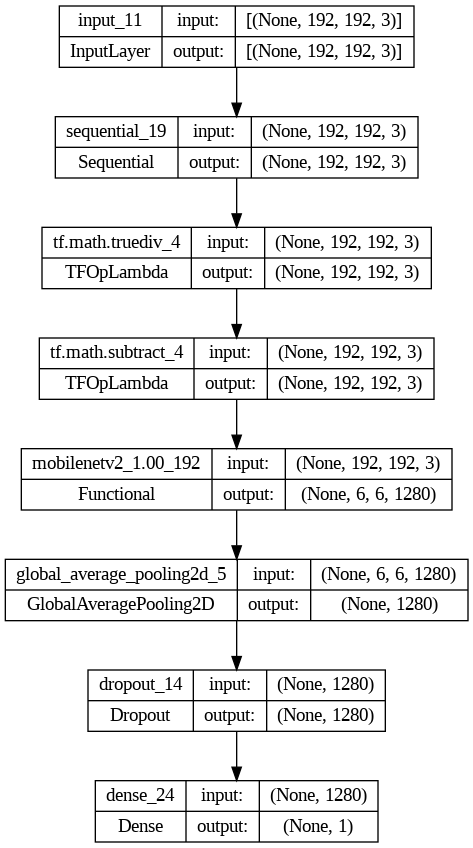

In [ ]:
# Lets see the shape of each layer

tf.keras.utils.plot_model(model, show_shapes=True)

Till we get to mobilenet the Input and Output shape of image remains the same.

## Assigning Learning Rate for the model


In [ ]:
# Compile the model

# Compile the model before training it.
#Since there are two classes, use the tf.keras.losses.BinaryCrossentropy loss with from_logits=True since the model provides a linear output.

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold=0, name='accuracy')])

In [ ]:
# Train the model
initial_epochs = 10
loss0, accuracy0 = model.evaluate(val_ds)

2/2 [==============================] - 1s 153ms/step - loss: 0.8208 - accuracy: 0.4231


In [ ]:
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

initial loss: 0.82
initial accuracy: 0.42


In [ ]:
history = model.fit(train_ds,
                    epochs=initial_epochs,
                    validation_data=val_ds)

Epoch 1/10
7/7 [==============================] - 5s 315ms/step - loss: 0.9721 - accuracy: 0.3704 - val_loss: 0.8261 - val_accuracy: 0.3846
Epoch 2/10
7/7 [==============================] - 2s 346ms/step - loss: 0.9363 - accuracy: 0.3426 - val_loss: 0.8252 - val_accuracy: 0.3846
Epoch 3/10
7/7 [==============================] - 3s 398ms/step - loss: 1.0114 - accuracy: 0.3796 - val_loss: 0.8292 - val_accuracy: 0.4231
Epoch 4/10
7/7 [==============================] - 4s 633ms/step - loss: 0.7919 - accuracy: 0.4722 - val_loss: 0.8344 - val_accuracy: 0.3846
Epoch 5/10
7/7 [==============================] - 2s 359ms/step - loss: 0.8411 - accuracy: 0.4722 - val_loss: 0.8359 - val_accuracy: 0.4231
Epoch 6/10
7/7 [==============================] - 3s 376ms/step - loss: 0.8600 - accuracy: 0.4722 - val_loss: 0.8306 - val_accuracy: 0.4231
Epoch 7/10
7/7 [==============================] - 2s 368ms/step - loss: 0.8347 - accuracy: 0.4815 - val_loss: 0.8240 - val_accuracy: 0.4231
Epoch 8/10
7/7 [====

Visualizing the training results

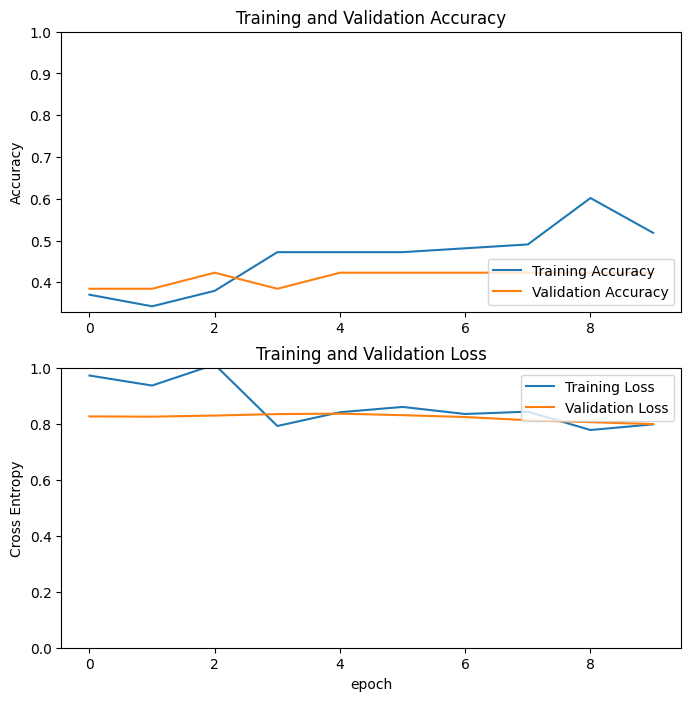

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

## As both test and train validation follow the same pattern, there is no overfitting but rather underfitting

## Implementing Fine Tuning using optimizer RMSprop

In [ ]:
# Un-freeze the top layers of the model
base_model.trainable = True

# No. of layers that are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

Number of layers in the base model:  154


In [ ]:
base_learning_rate = 0.0001

model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold=0, name='accuracy')])

In [ ]:
model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 192, 192, 3)]     0         
                                                                 
 sequential_19 (Sequential)  (None, 192, 192, 3)       0         
                                                                 
 tf.math.truediv_4 (TFOpLam  (None, 192, 192, 3)       0         
 bda)                                                            
                                                                 
 tf.math.subtract_4 (TFOpLa  (None, 192, 192, 3)       0         
 mbda)                                                           
                                                                 
 mobilenetv2_1.00_192 (Func  (None, 6, 6, 1280)        2257984   
 tional)                                                         
                                                           

We find in total 2259265 paramenter out of which we have train 1862721 parameters

In [ ]:
history = model.fit(train_ds,
                    epochs=initial_epochs,
                    validation_data=val_ds)

Epoch 1/10
7/7 [==============================] - 8s 585ms/step - loss: 1.2186 - accuracy: 0.7037 - val_loss: 0.3455 - val_accuracy: 0.9231
Epoch 2/10
7/7 [==============================] - 4s 523ms/step - loss: 0.2040 - accuracy: 0.9352 - val_loss: 0.1468 - val_accuracy: 1.0000
Epoch 3/10
7/7 [==============================] - 3s 484ms/step - loss: 0.0934 - accuracy: 0.9815 - val_loss: 0.1109 - val_accuracy: 0.9231
Epoch 4/10
7/7 [==============================] - 4s 583ms/step - loss: 0.5297 - accuracy: 0.8333 - val_loss: 0.1275 - val_accuracy: 1.0000
Epoch 5/10
7/7 [==============================] - 3s 481ms/step - loss: 0.0709 - accuracy: 0.9722 - val_loss: 0.2777 - val_accuracy: 0.8846
Epoch 6/10
7/7 [==============================] - 3s 474ms/step - loss: 0.0367 - accuracy: 0.9907 - val_loss: 0.2060 - val_accuracy: 0.8846
Epoch 7/10
7/7 [==============================] - 4s 573ms/step - loss: 0.0128 - accuracy: 1.0000 - val_loss: 0.2640 - val_accuracy: 0.8846
Epoch 8/10
7/7 [====

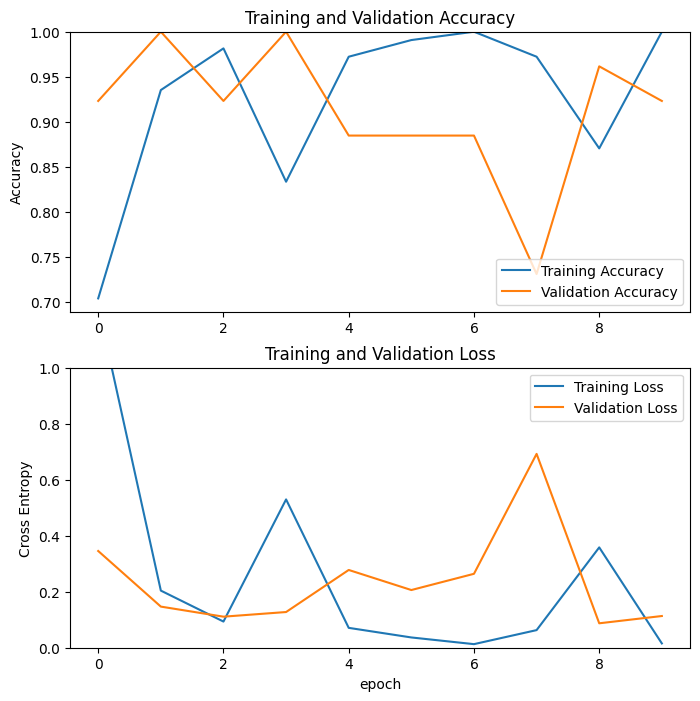

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

## We see a major improvement in our model. With best result in epoch 10
* loss: 0.0154
* accuracy: 1.0000
* val_loss: 0.1132
* val_accuracy: 0.9231

## For Further Fine tuning of the model we can Assign Multiple Learning Rate

* By assiging different learning rate eg. 0.001, 0.0001, 0.00001, we teach the model as slow as possible. This might be more time taking but increase the result of our model

* This time also use early stopping with patience

In [ ]:
base_learning_rate = [0.01, 0.001, 0.00001]

for bsl in base_learning_rate:
  model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.RMSprop(learning_rate=bsl),
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold=0, name='accuracy')])
  # early stopping -
  es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

  epochs = 30
  history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[es]
  )
  print('===========================================  MODEL ENDS =========================')

Epoch 1/30
7/7 [==============================] - 8s 561ms/step - loss: 22.7475 - accuracy: 0.5833 - val_loss: 1.1733 - val_accuracy: 0.6923
Epoch 2/30
7/7 [==============================] - 3s 483ms/step - loss: 12.1308 - accuracy: 0.4815 - val_loss: 4.6484 - val_accuracy: 0.6923
Epoch 3/30
7/7 [==============================] - 4s 603ms/step - loss: 10.6469 - accuracy: 0.4907 - val_loss: 3.5788 - val_accuracy: 0.6923
Epoch 4/30
7/7 [==============================] - 3s 480ms/step - loss: 7.8086 - accuracy: 0.5463 - val_loss: 8.3370 - val_accuracy: 0.6923
Epoch 5/30
7/7 [==============================] - 3s 500ms/step - loss: 9.4603 - accuracy: 0.5185 - val_loss: 5.8306 - val_accuracy: 0.6923
Epoch 6/30
7/7 [==============================] - 3s 497ms/step - loss: 9.4872 - accuracy: 0.5185 - val_loss: 3.5518 - val_accuracy: 0.6923
Epoch 7/30
7/7 [==============================] - 3s 494ms/step - loss: 9.5105 - accuracy: 0.4907 - val_loss: 4.0041 - val_accuracy: 0.6923
Epoch 8/30
7/7 [=

## This does not give us better results

The best one is
* loss: 7.8086
* accuracy: 0.5463
* val_loss: 8.3370
* val_accuracy: 0.6923

# Summary

* When implementing **convolutional neural network (CNN)** we find the best result on performing multiple dropout on different layer and increasing the number of epochs. The best result we get is : **loss**: 0.0487, **accuracy**: 0.9722, **val_loss**: 0.2578, **val_accuracy**: 0.9615

* When implementing transfer learning algorithm for the same dataset, we find the best result on changing out optimizer to RMSprop. The best result we get is: **loss**: 0.0154, **accuracy**: 1.0000, **val_loss**: 0.1132, **val_accuracy**: 0.9231
* we can further optimze our model using different models and also using different metrics as "precission", "recall", etc